# map

In [1]:
import h5py  #导入工具包

from PIL import Image

In [7]:
f = h5py.File('/Users/psyche910/Desktop/Master.1/thesis/paper code/data/ANTWERP_static.h5','r')   #打开h5文件
for key in f.keys():
    print(f[key].name)
    print(f[key].shape)
    a=f[key][:]
print(a[0])
b=a[0]
#矩阵转图像
image1= Image.fromarray(b)
image1.show()

/array
(9, 495, 436)
[[ 1  4  4 ...  5 16 72]
 [ 3  5  0 ... 12  1 21]
 [ 0  0  0 ... 11  5 10]
 ...
 [ 0  0  1 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]]


In [8]:
f = h5py.File('/Users/psyche910/Desktop/Master.1/thesis/paper code/data/ANTWERP_map_high_res.h5','r')   #打开h5文件
                           #可以查看所有的主键
for key in f.keys():
    print(f[key].name)
    print(f[key].shape)
    a2=f[key][:]
#矩阵转图像
image2= Image.fromarray(a2)
image2.show()

/array
(4950, 4360)


In [9]:
a.shape

(9, 495, 436)

# map01

## Higher Resolution Map

In [10]:
import h5py  #导入工具包
import numpy as np
from PIL import Image
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.pyplot import MultipleLocator

In [13]:
f = h5py.File("/Users/psyche910/Desktop/Master.1/thesis/paper code/data/ANTWERP_static.h5",'r')   #打开h5文件
for key in f.keys():
    ANTWERP=f[key][:]
    
f = h5py.File('/Users/psyche910/Desktop/Master.1/thesis/paper code/data/BANGKOK_static.h5','r')   #打开h5文件
for key in f.keys():
    BANGKOK=f[key][:]
    
f = h5py.File('/Users/psyche910/Desktop/Master.1/thesis/paper code/data/BARCELONA_static.h5','r')   #打开h5文件
for key in f.keys():
    BARCELONA=f[key][:]

In [14]:
#读取h5文件转为矩阵
f = h5py.File('/Users/psyche910/Desktop/Master.1/thesis/paper code/data/ANTWERP_map_high_res.h5','r') 
for key in f.keys():
    ANTWERP2=f[key][:]

f = h5py.File('/Users/psyche910/Desktop/Master.1/thesis/paper code/data/BANGKOK_map_high_res.h5','r') 
for key in f.keys():
    BANGKOK2=f[key][:]   
    
f = h5py.File('/Users/psyche910/Desktop/Master.1/thesis/paper code/data/BARCELONA_map_high_res.h5','r') 
for key in f.keys():
    BARCELONA2=f[key][:]

读取静态地图和高分辨率数据，数据取出一个巨大的 numpy 矩阵，是地图像素矩阵，本质是城市地图图片

画地图的工具

In [15]:
#map
def map(city,rotate,figname): #画地图的工具
    image= Image.fromarray(city) #numpy矩阵 → 图片
    image=image.rotate(rotate)
    plt.figure(figsize=(20,20),dpi=100)
    plt.imshow(image,cmap=plt.cm.gray_r)#gray_r 灰度图反转
    plt.xticks([])
    plt.yticks([])
    plt.savefig(fname=figname,dpi=100,bbox_inches = 'tight')
    
#     #draw grid
#     x = MultipleLocator(50)    
#     y = MultipleLocator(40)   
#     # interval
#     ax = plt.gca()
#     ax.xaxis.set_major_locator(x)
#     ax.yaxis.set_major_locator(y)
#     #draw
#     plt.grid(color = 'k', linewidth = 1, alpha=0.5)

In [16]:
#map增加网格线版本
def map_grid(city,rotate):
    
    image= Image.fromarray(city)
    image=image.rotate(rotate)
    plt.figure(figsize=(20,20),dpi=300)
    plt.imshow(image,cmap=plt.cm.gray_r)
    plt.xticks([])
    plt.yticks([])
    
    #draw grid 每隔10个像素画一条线
    x = MultipleLocator(10)    
    y = MultipleLocator(10)   
    # interval
    ax = plt.gca()
    ax.xaxis.set_major_locator(x)
    ax.yaxis.set_major_locator(y)
    #draw
    plt.grid(color = 'r', linewidth = 2, alpha=1)

## Three cities

### ANTWERP

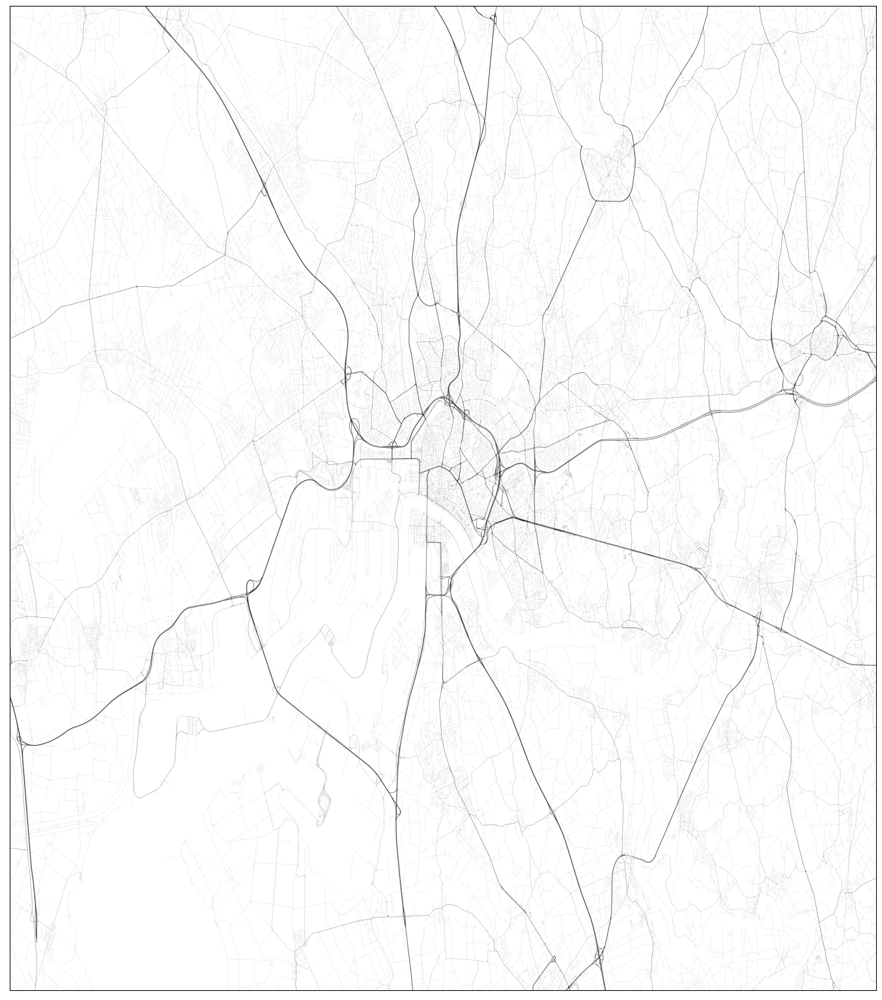

In [17]:
map(ANTWERP2,0,"ANTWERP_high_res.pdf")

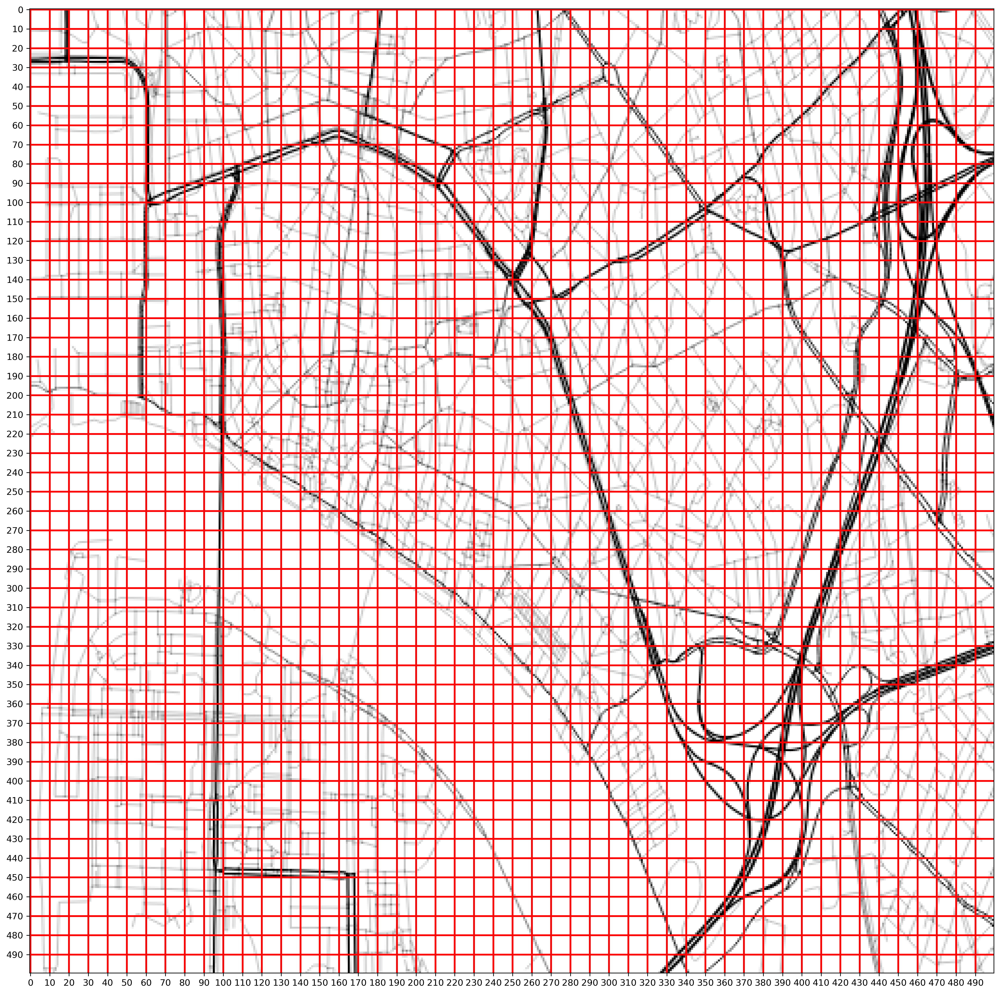

In [18]:
map_grid(ANTWERP2[2250:2750,2000:2500],0)
#从第 2250 到 2750 行从第 2000 到 2500 列，裁剪出一个局部区域。得到500x500小地图，从整个城市地图里放大截取一个局部街区

### BANGKOK

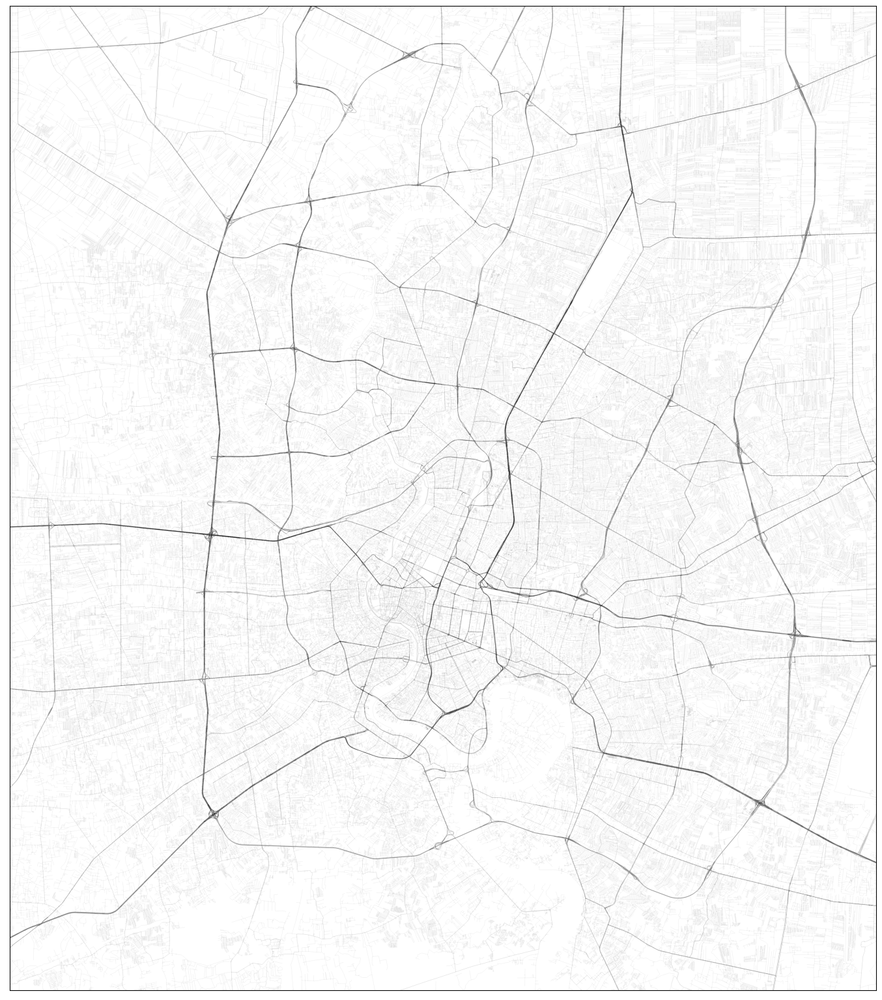

In [19]:
map(BANGKOK2,0,"BANGKOK_high_res.pdf")

### BARCELONA

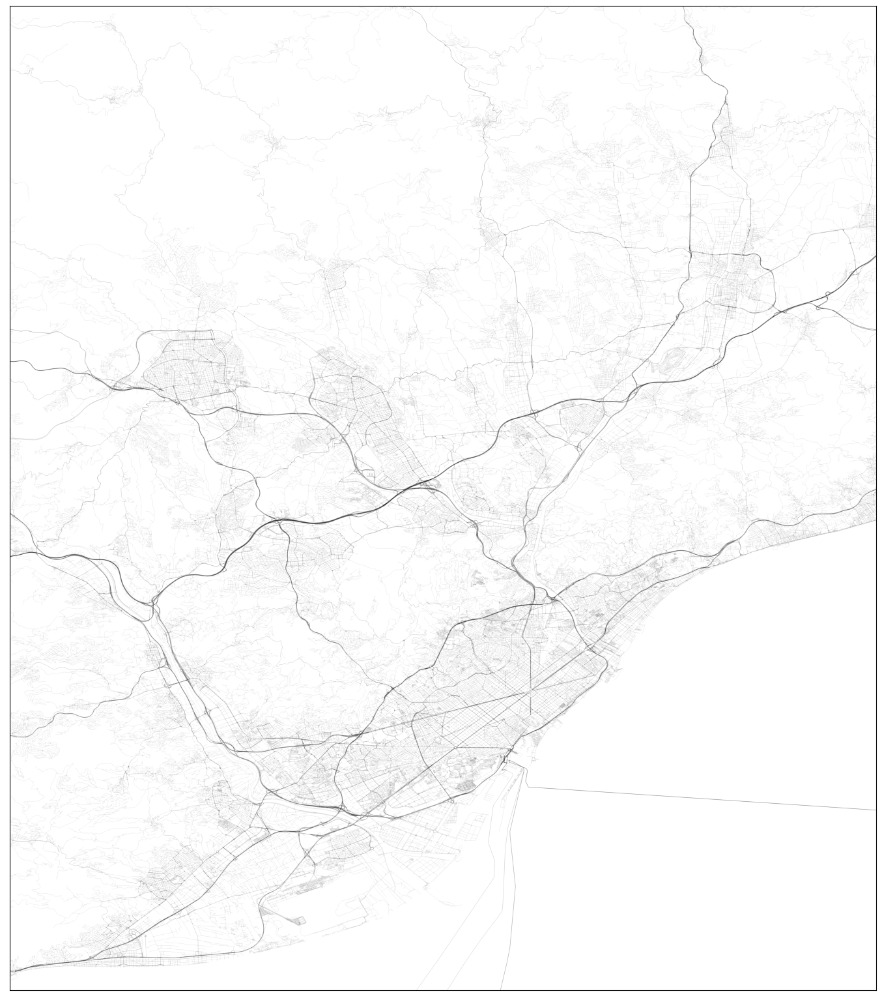

In [20]:
map(BARCELONA2,0,"BARCELONA_high_res.pdf")

# Heatmap

In [21]:
#IO operation
def load_variable(filename):
   f=open(filename,'rb')
   r=pickle.load(f)#保存变量
   f.close()
   return r
def save_variable(v,filename):
    f=open(filename,'wb')
    pickle.dump(v,f)#读取变量
    f.close()
    return filename
def readdata(filename1,filename2):#readdata()。这里真正把交通数据读进来了
    filename1 = load_variable(f'{filename1}.txt') 
    filename2 = load_variable(f'{filename2}.txt')
    filename1 = np.array(filename1)#单日各网格交通量累计361天(361,495,436,8)
    filename2 = np.array(filename2)#单日全网络交通量累计361天(361,4)  
    print(f"Grid is read successfully and the dimension of the data is:{filename1.shape}")
    print(f"Network is read successfully and the dimension of the data is:{filename2.shape}")
    return filename1,filename2

定义数据处理流程，后续调用
readdata() 才会运行
load_variable() 才会运行
open(...,'rb') 才会真正读取文件
pickle 才会真正恢复数据
numpy 才会真正形成 (361,495,436,8) 的大张量

In [22]:
def padding (grid_data):
    grid_data_pad=np.zeros((361,496,436,8))#361天 496x436 8个特征
    grid_data_pad[:,:495,:436,:8]=grid_data
    grid_data=grid_data_pad
    print(f"shape of grid: {grid_data.shape}")
    return grid_data
    #补边，原始高度是 495，但很多深度学习操作更喜欢规则尺寸，多补了一行全 0 数据，把 495 补成 496。这样后面做卷积、merge、grid切分时更方便。

In [23]:
#Grid merge
def Merge(Grid,a,b):#要把axb个小 grid 合并成一个大 grid。
    """
    The input should be a 4-dimension grids data (Time,Height,Width,Variables)
    a is the Height of a single grid after the merge, which  should be choose in (1，3，5，9，11，15，33，45，55，99，165，495)
    b is the Width of a single grid after the merge, which  should be choose in (1，2，4，109，218，436)
    a should be one of the factors of height
    b should be one of the factors of width
    After the merge the shape of data will be (x,y,361,8)
    x=Heigh/a , y=Width/b
    each (x,y) contains a sequence data,with shape(361,8)
    """
    Grid_temp=np.zeros([int(len(Grid[1])/a),int(len(Grid[1][1])/b)])#创建聚合后网络
    Grid_temp=Grid_temp.tolist()
    for i in range(0,int(len(Grid[1])),a):
        for j in range (0,int(len(Grid[1][1])),b):##按块扫描整个城市
            Grid_temp[int(i/a)][int(j/b)]=(Grid[:,i:i+a,j:j+b,:].sum(axis=(1,2)))
            #取一个 a×b 的空间区域，然后把这个区域里的所有小 grid 求和，只对空间维度求和，没有对时间求和，所以：361 天的信息还保留只是空间被压缩了
            #因此 merge 后的数据，本质上就从：“路口级交通”变成：“区域级交通”。
            #每一个grid是一个(361,8)矩阵，就变成了（496/a，436/b，361，8）
    Grid_temp=np.array(Grid_temp)
    print(f"The shape of the input grid data  has been from {Grid.shape} change into {Grid_temp.shape}\n")
    return Grid_temp

In [24]:
def heatmap(pre,mini,post,avg,vmin,vmax):
    """
    The input should be a single grid 
    And the city_name shoule be a str type
    """
    data=[pre,mini,post,avg]#放到一个list里
    title=["Pre-disaster","Minimum point","Post disaster","Average"]
    figure, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10), dpi=300)
    for i in range (4):
        axes[int(i/2),int(i%2)].imshow(data[i],cmap=plt.cm.hot_r,vmin=vmin, vmax=vmax)            #int(0/2),int(0%2)=(0,0)
        axes[int(i/2),int(i%2)].set_xticks([]);                              #int(1/2),int(1%2)=(0,1)
        axes[int(i/2),int(i%2)].set_yticks([]);                        #int(2/2),int(2%2)=(1,0)    
        axes[int(i/2),int(i%2)].set_title(f"{title[i]}",fontsize=10)#int(2/2),int(2%2)=(1,0)     
    figure.colorbar(axes[0][0].imshow(data[3], cmap=plt.cm.hot_r, vmin=vmin, vmax=vmax), ax=axes.ravel().tolist())
    plt.show()

这段代码本质上是在“把四张二维网格图（grid）同时画成热力图（heatmap）”，比如：
灾前交通状态（pre）灾害最严重时（mini）灾后状态（post）平均状态（avg） 一般都是二维矩阵 每个格子的交通流量
vmin/max 颜色最大最小值
data[0] = pre
data[1] = mini
data[2] = post
data[3] = avg

## 100x100 grid

In [31]:
ANTWERP_Grid,ANTWERP_Network=readdata("/Users/psyche910/Desktop/Master.1/thesis/paper code/data/ANTWERP_Grid","/Users/psyche910/Desktop/Master.1/thesis/paper code/data/ANTWERP_Network")
BANGKOK_Grid,BANGKOK_Network=readdata("/Users/psyche910/Desktop/Master.1/thesis/paper code/data/BANGKOK_Grid","/Users/psyche910/Desktop/Master.1/thesis/paper code/data/BANGKOK_Network")
BARCELONA_Grid,BARCELONA_Network=readdata("/Users/psyche910/Desktop/Master.1/thesis/paper code/data/BARCELONA_Grid","/Users/psyche910/Desktop/Master.1/thesis/paper code/data/BARCELONA_Network")

Grid is read successfully and the dimension of the data is:(361, 495, 436, 8)
Network is read successfully and the dimension of the data is:(361, 4)
Grid is read successfully and the dimension of the data is:(361, 495, 436, 8)
Network is read successfully and the dimension of the data is:(361, 4)
Grid is read successfully and the dimension of the data is:(361, 495, 436, 8)
Network is read successfully and the dimension of the data is:(361, 4)


In [41]:
ANTWERP_Merge=Merge(ANTWERP_Grid,1,1)
ANTWERP_Pre_volume=np.sum(ANTWERP_Merge[:,:,:180,0:-1:2],axis=(2,3))/180
ANTWERP_Mini_volume=np.sum(ANTWERP_Merge[:,:,250:300,0:-1:2],axis=(2,3))/50
ANTWERP_Post_volume=np.sum(ANTWERP_Merge[:,:,-7:,0:-1:2],axis=(2,3))/7
ANTWERP_AVG_volume=np.sum(ANTWERP_Merge[:,:,:,0:-1:2],axis=(2,3))/361

The shape of the input grid data  has been from (361, 495, 436, 8) change into (495, 436, 361, 8)



In [42]:
BANGKOK_Merge=Merge(BANGKOK_Grid,1,1)
BANGKOK_Pre_volume=np.sum(BANGKOK_Merge[:,:,:180,0:-1:2],axis=(2,3))/180 
#180: 180～360天， 181个时间片; 取偶数通道 只要volumn
BANGKOK_Mini_volume=np.sum(BANGKOK_Merge[:,:,250:300,0:-1:2],axis=(2,3))/50
#180: 灾害最严重
BANGKOK_Post_volume=np.sum(BANGKOK_Merge[:,:,-7:,0:-1:2],axis=(2,3))/7
#最后7个时间片 灾害恢复后
BANGKOK_AVG_volume=np.sum(BANGKOK_Merge[:,:,:,0:-1:2],axis=(2,3))/361
#时间全取

The shape of the input grid data  has been from (361, 495, 436, 8) change into (495, 436, 361, 8)



In [43]:
BARCELONA_Merge=Merge(BARCELONA_Grid,1,1)
BARCELONA_Pre_volume=np.sum(BARCELONA_Merge[:,:,:180,0:-1:2],axis=(2,3))/180
BARCELONA_Mini_volume=np.sum(BARCELONA_Merge[:,:,250:300,0:-1:2],axis=(2,3))/50
BARCELONA_Post_volume=np.sum(BARCELONA_Merge[:,:,-7:,0:-1:2],axis=(2,3))/7
BARCELONA_AVG_volume=np.sum(BARCELONA_Merge[:,:,:,0:-1:2],axis=(2,3))/361

The shape of the input grid data  has been from (361, 495, 436, 8) change into (495, 436, 361, 8)



### ANTWERP

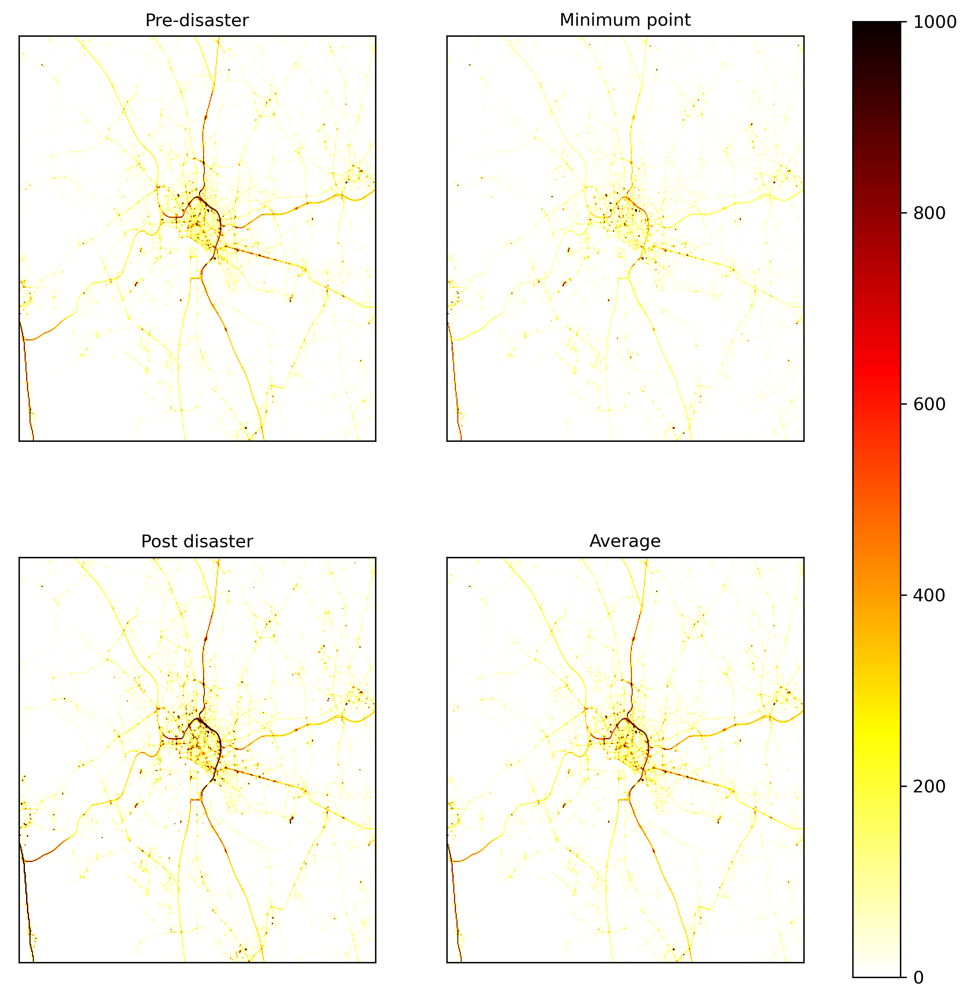

In [44]:
heatmap(ANTWERP_Pre_volume,ANTWERP_Mini_volume,ANTWERP_Post_volume,ANTWERP_AVG_volume,0,1000) 

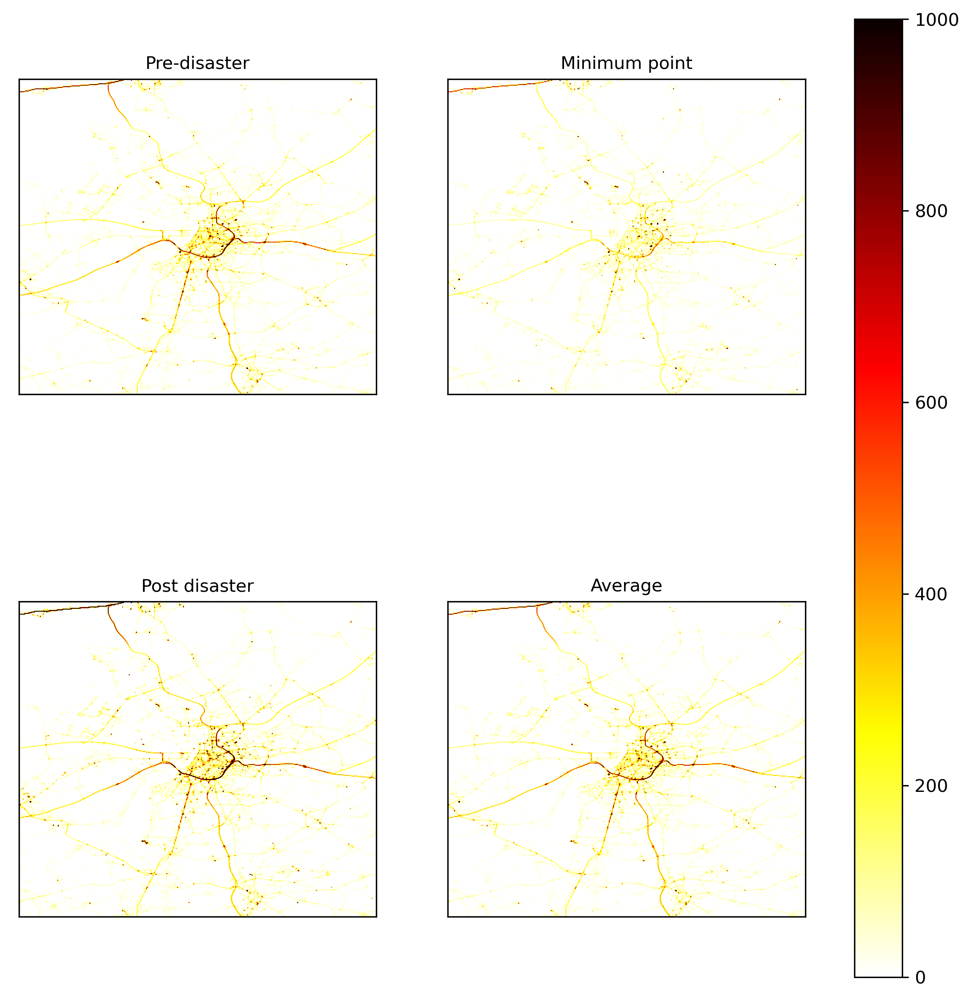

In [45]:
heatmap(np.rot90(np.rot90(np.rot90(ANTWERP_Pre_volume))),np.rot90(np.rot90(np.rot90(ANTWERP_Mini_volume))),
         np.rot90(np.rot90(np.rot90(ANTWERP_Post_volume))),np.rot90(np.rot90(np.rot90(ANTWERP_AVG_volume))),0,1000) 

### BANGKOK

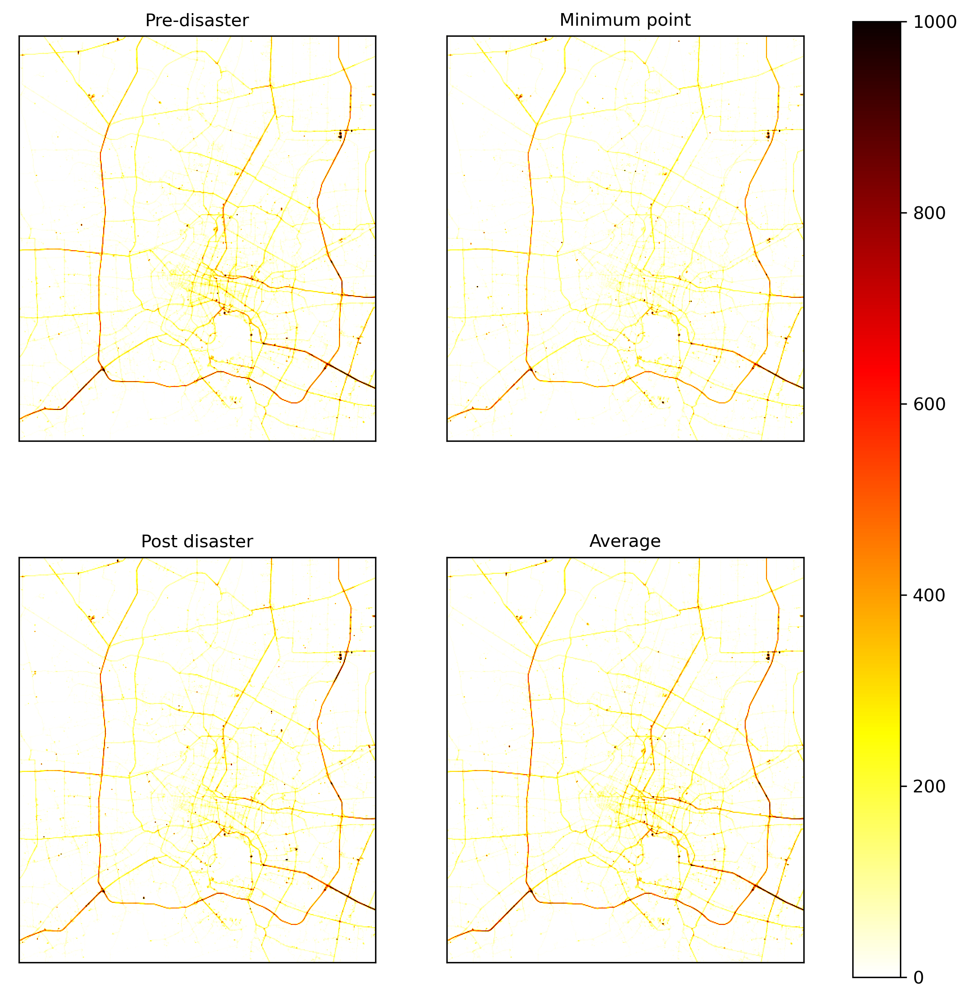

In [46]:
heatmap(BANGKOK_Pre_volume,BANGKOK_Mini_volume,BANGKOK_Post_volume,BANGKOK_AVG_volume,0,1000) 

### BARCELONA

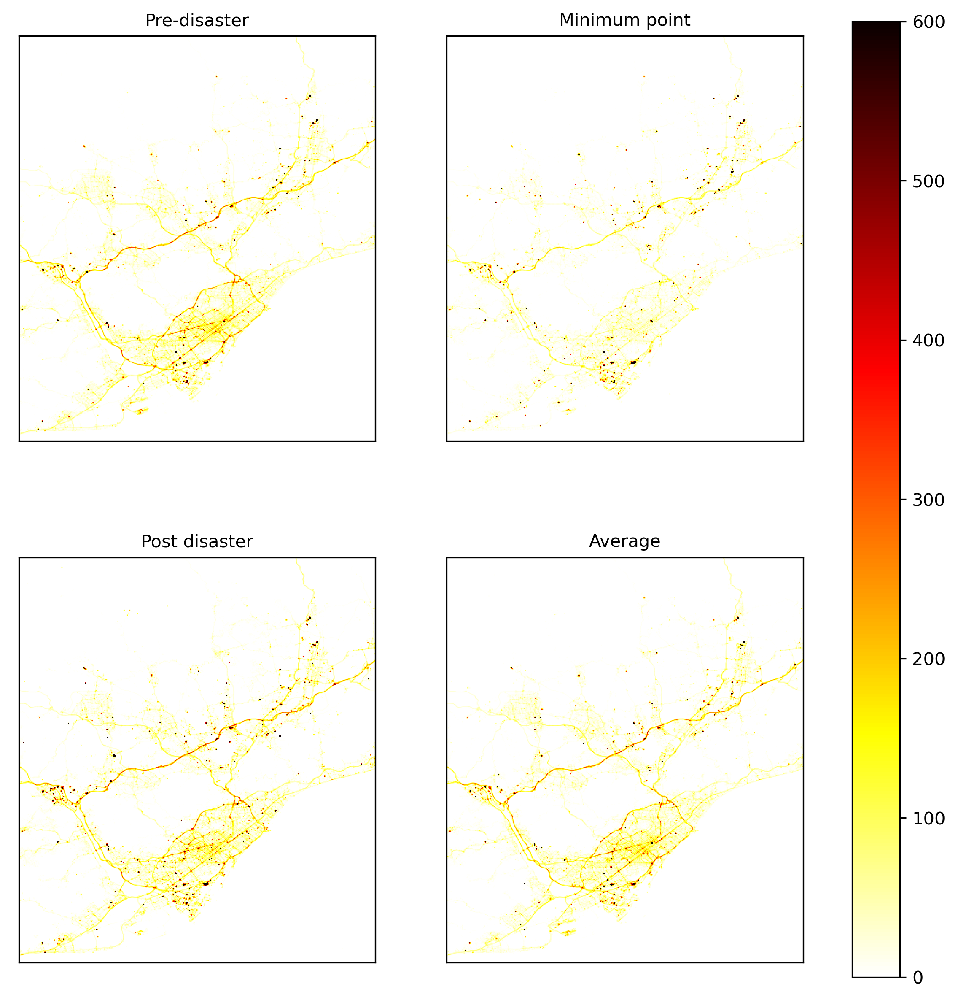

In [47]:
heatmap(BARCELONA_Pre_volume,BARCELONA_Mini_volume,BARCELONA_Post_volume,BARCELONA_AVG_volume,0,600) 

## 200x200 grid

In [48]:
ANTWERP_Grid2=padding(ANTWERP_Grid)
ANTWERP_Merge2=Merge(ANTWERP_Grid2,2,2)
ANTWERP_Pre_volume2=np.sum(ANTWERP_Merge2[:,:,:180,0:-1:2],axis=(2,3))/180
ANTWERP_Mini_volume2=np.sum(ANTWERP_Merge2[:,:,250:300,0:-1:2],axis=(2,3))/50
ANTWERP_Post_volume2=np.sum(ANTWERP_Merge2[:,:,-7:,0:-1:2],axis=(2,3))/7
ANTWERP_AVG_volume2=np.sum(ANTWERP_Merge2[:,:,:,0:-1:2],axis=(2,3))/361

shape of grid: (361, 496, 436, 8)
The shape of the input grid data  has been from (361, 496, 436, 8) change into (248, 218, 361, 8)



In [49]:
BANGKOK_Grid2=padding(BANGKOK_Grid)
BANGKOK_Merge2=Merge(BANGKOK_Grid2,2,2)
BANGKOK_Pre_volume2=np.sum(BANGKOK_Merge2[:,::180,0:-1:2],axis=(2,3))/180
BANGKOK_Mini_volume2=np.sum(BANGKOK_Merge2[:,:,250:300,0:-1:2],axis=(2,3))/50
BANGKOK_Post_volume2=np.sum(BANGKOK_Merge2[:,:,-7:,0:-1:2],axis=(2,3))/7
BANGKOK_AVG_volume2=np.sum(BANGKOK_Merge2[:,:,:,0:-1:2],axis=(2,3))/361

shape of grid: (361, 496, 436, 8)
The shape of the input grid data  has been from (361, 496, 436, 8) change into (248, 218, 361, 8)



In [50]:
BARCELONA_Grid2=padding(BARCELONA_Grid)
BARCELONA_Merge2=Merge(BARCELONA_Grid2,2,2)
BARCELONA_Pre_volume2=np.sum(BARCELONA_Merge2[:,:,:180,0:-1:2],axis=(2,3))/180
BARCELONA_Mini_volume2=np.sum(BARCELONA_Merge2[:,:,250:300,0:-1:2],axis=(2,3))/50
BARCELONA_Post_volume2=np.sum(BARCELONA_Merge2[:,:,-7:,0:-1:2],axis=(2,3))/7
BARCELONA_AVG_volume2=np.sum(BARCELONA_Merge2[:,:,:,0:-1:2],axis=(2,3))/361

shape of grid: (361, 496, 436, 8)
The shape of the input grid data  has been from (361, 496, 436, 8) change into (248, 218, 361, 8)



### ANTWERP

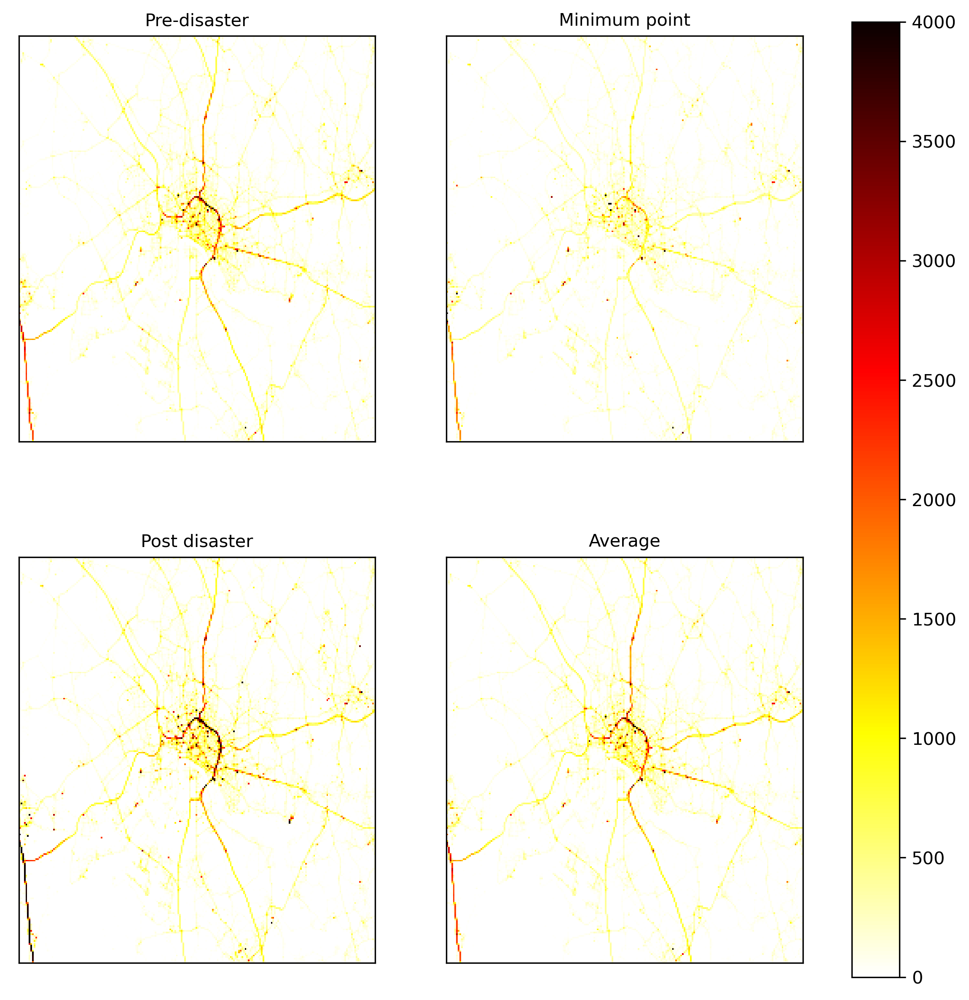

In [51]:
heatmap(ANTWERP_Pre_volume2,ANTWERP_Mini_volume2,ANTWERP_Post_volume2,ANTWERP_AVG_volume2,0,4000) 

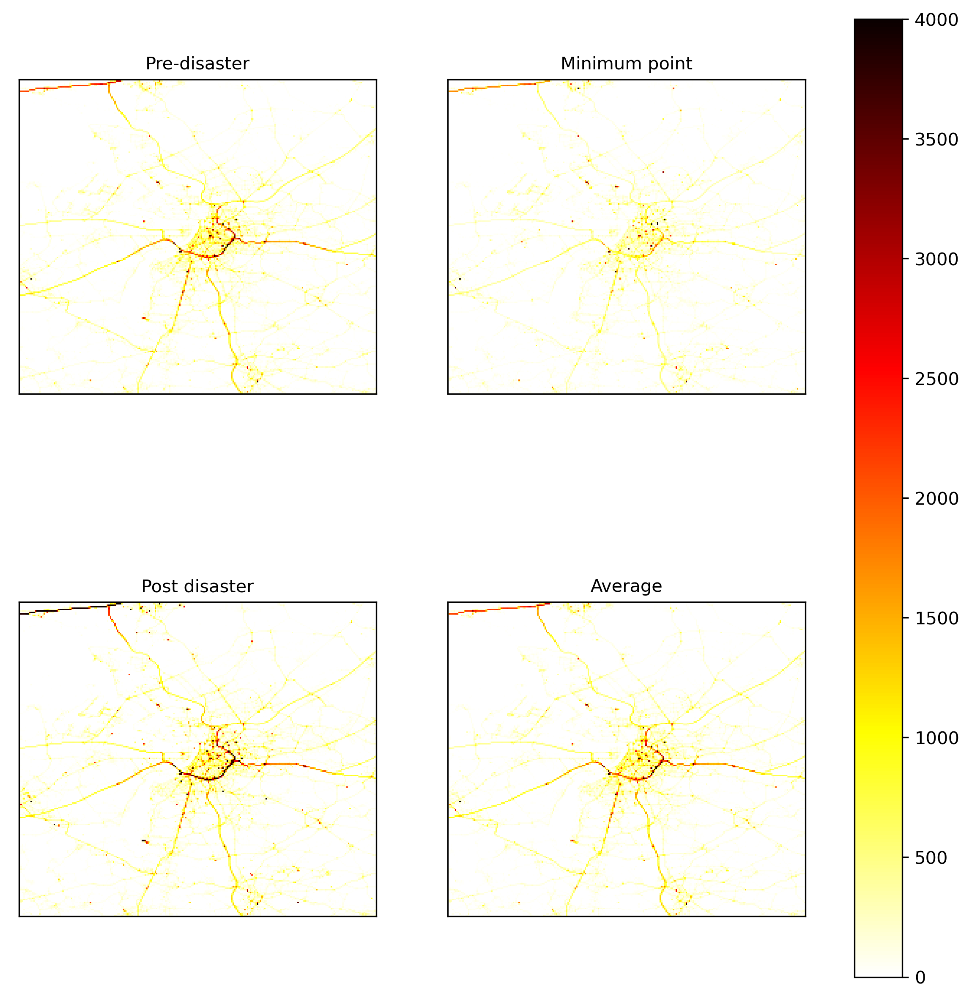

In [52]:
heatmap(np.rot90(np.rot90(np.rot90(ANTWERP_Pre_volume2))),np.rot90(np.rot90(np.rot90(ANTWERP_Mini_volume2))),
         np.rot90(np.rot90(np.rot90(ANTWERP_Post_volume2))),np.rot90(np.rot90(np.rot90(ANTWERP_AVG_volume2))),0,4000) 

### BANGKOK

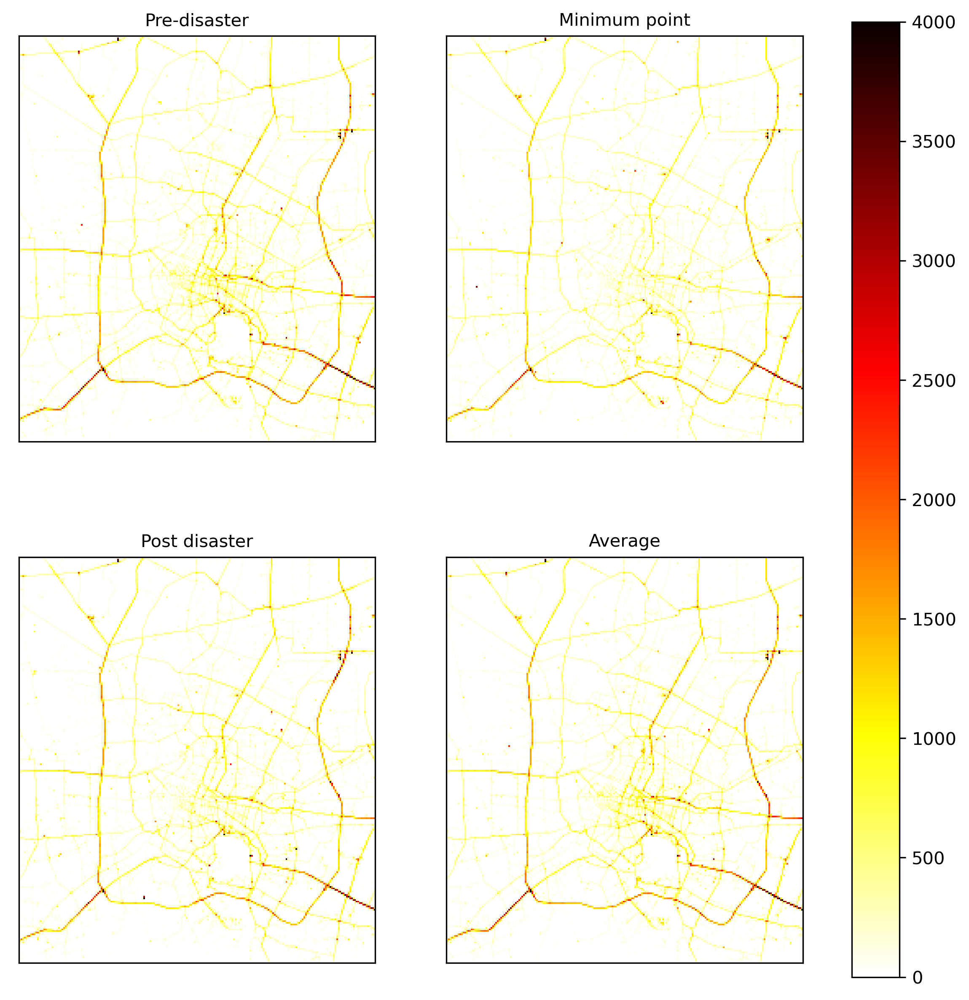

In [53]:
heatmap(BANGKOK_Pre_volume2,BANGKOK_Mini_volume2,BANGKOK_Post_volume2,BANGKOK_AVG_volume2,0,4000) 

### BARCELONA

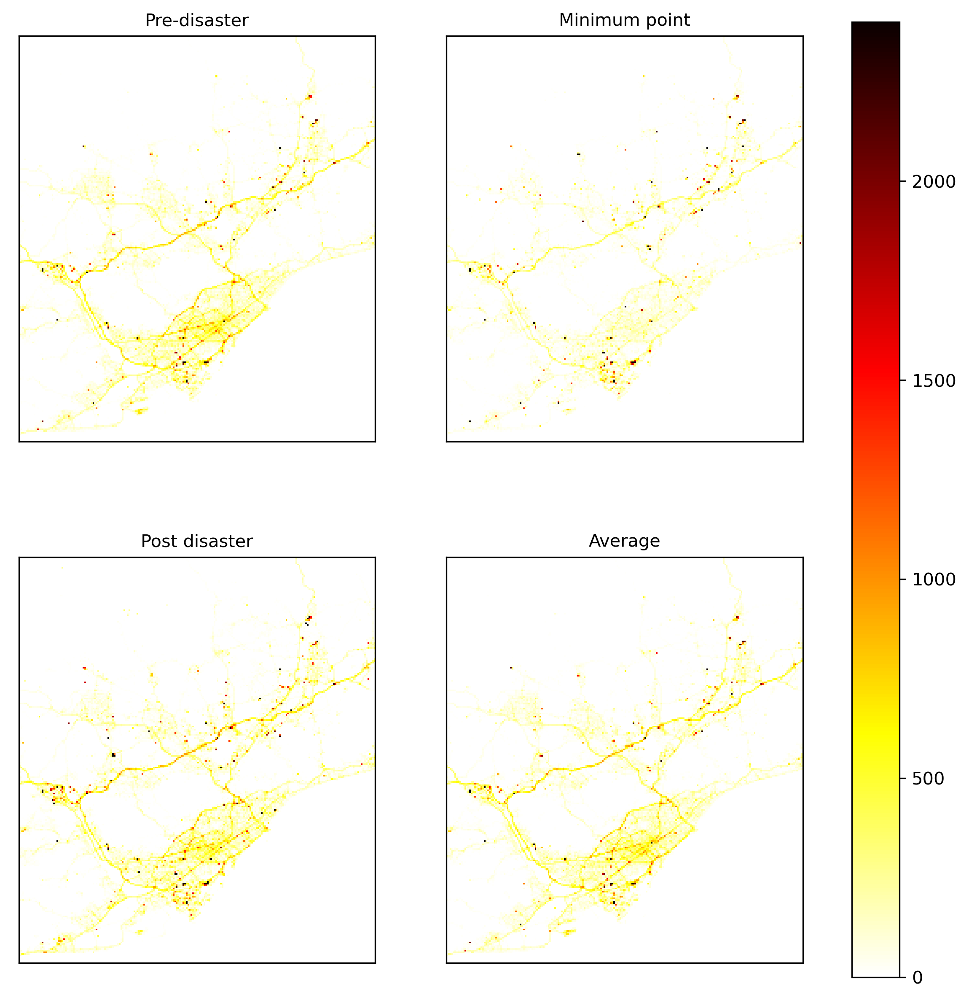

In [54]:
heatmap(BARCELONA_Pre_volume2,BARCELONA_Mini_volume2,BARCELONA_Post_volume2,BARCELONA_AVG_volume2,0,2400) 

# Edge 

In [55]:
def edge_index(CITY_edge):
    #north connection
    CITY_edge[0,0,:]==0#将第零行向北连接的元素归0，避免连接到图外
    CITY_N=CITY_edge[0,:,:]
    CITY_N=CITY_N.reshape(-1)
    #创建两列数组，元素是索引值
    N=np.arange(len(CITY_N)) 
    N=np.vstack((N,np.arange(len(CITY_N))))
    #将相连的数组索引对齐，创建北边连接的点对,取出相连接的对,去掉连接到图外的边
    N[1,:][CITY_N==0]=99999999#对终点行进行修改，将不存在连接的节点变为无限大，方便以后删除
    N[1,:][CITY_N!=0]=N[1,:][CITY_N!=0]-436
    N=N[:,N.sum(axis=0)<9999999]#删除没有连接的节点

    # NE connection
    CITY_edge[1,0,:]==0#将第零行向北连接的元素归0，避免连接到图外
    CITY_edge[1,:,435]==0#将最后一列向东连接的元素归0，避免连接到图外
    CITY_NE=CITY_edge[1,:,:]
    CITY_NE=CITY_NE.reshape(-1)
    #创建两列数组，元素是索引值
    NE=np.arange(len(CITY_NE)) 
    NE=np.vstack((NE,np.arange(len(CITY_NE))))
    #将相连的数组索引对齐，创建东北边连接的点对,取出相连接的对,去掉连接到图外的边
    NE[1,:][CITY_NE==0]=99999999
    NE[1,:][CITY_NE!=0]=NE[1,:][CITY_NE!=0]-435
    NE=NE[:,NE.sum(axis=0)<9999999]


    # E connection
    CITY_edge[2,:,435]==0#将最后一列向东连接元素归0
    CITY_E=CITY_edge[2,:,:]
    CITY_E=CITY_E.reshape(-1)
    #创建两列数组，元素是索引值
    E=np.arange(len(CITY_E)) 
    E=np.vstack((E,np.arange(len(CITY_E))))
    #将相连的数组索引对齐，创建东边连接的点对,取出相连接的对,去掉连接到图外的边
    E[1,:][CITY_E==0]=99999999
    E[1,:][CITY_E!=0]=E[1,:][CITY_E!=0]+1
    E=E[:,E.sum(axis=0)<9999999]

    #SE connnection
    CITY_edge[3,494,:]==0#将最后一行向南连接的元素归0，去掉连接到图外的边
    CITY_edge[3,:,435]==0#将最后一列向东连接的元素归0，去掉连接到图外的边
    CITY_SE=CITY_edge[3,:,:]
    CITY_SE=CITY_SE.reshape(-1)
    #创建两列数组，元素是索引值
    SE=np.arange(len(CITY_SE)) 
    SE=np.vstack((SE,np.arange(len(CITY_SE))))
    #将相连的数组索引对齐，创建东边连接的点对,取出相连接的对,去掉连接到图外的边
    SE[1,:][CITY_SE==0]=99999999
    SE[1,:][CITY_SE!=0]=SE[1,:][CITY_SE!=0]+437
    SE=SE[:,SE.sum(axis=0)<9999999]


    #S connnection
    #将最后一行向南连接的元素归0，去掉连接到图外的边
    CITY_edge[4,494,:]==0
    CITY_S=CITY_edge[4,:,:]
    CITY_S=CITY_S.reshape(-1)
    #创建两列数组，元素是索引值
    S=np.arange(len(CITY_S)) 
    S=np.vstack((S,np.arange(len(CITY_S))))
    #将相连的数组索引对齐，创建东边连接的点对,取出相连接的对,去掉连接到图外的边
    S[1,:][CITY_S==0]=99999999#
    S[1,:][CITY_S!=0]=S[1,:][CITY_S!=0]+436
    S=S[:,S.sum(axis=0)<9999999]


    #SW connection
    CITY_edge[5,494,:]==0#将最后一行向南连接的元素归0，去掉连接到图外的边
    CITY_edge[5,:,0]==0#将第0列向西连接的元素归0，去掉连接到图外的边
    CITY_SW=CITY_edge[5,:,:]
    CITY_SW=CITY_SW.reshape(-1)
    #创建两列数组，元素是索引值
    SW=np.arange(len(CITY_SW)) 
    SW=np.vstack((SW,np.arange(len(CITY_SW))))
    #将相连的数组索引对齐，创建东边连接的点对,取出相连接的对,去掉连接到图外的边
    SW[1,:][CITY_SW==0]=99999999
    SW[1,:][CITY_SW!=0]=SW[1,:][CITY_SW!=0]+435
    SW=SW[:,SW.sum(axis=0)<9999999]


    #W connection
    #将第零列向西连接的元素归0，去掉连接到图外的边
    CITY_edge[6,:,0]==0
    CITY_W=CITY_edge[6,:,:]
    CITY_W=CITY_W.reshape(-1)
    #创建两列数组，元素是索引值
    W=np.arange(len(CITY_W)) 
    W=np.vstack((W,np.arange(len(CITY_W))))
    #将相连的数组索引对齐，创建东边连接的点对,取出相连接的对,去掉连接到图外的边
    W[1,:][CITY_W==0]=99999999
    W[1,:][CITY_W!=0]=W[1,:][CITY_W!=0]-1
    W=W[:,W.sum(axis=0)<9999999]


    #NW connection
    CITY_edge[7,0,:]==0#将第零行向北连接的元素归0，去掉连接到图外的边
    CITY_edge[7,:,0]==0#将第零列向西连接的元素归0，去掉连接到图外的边
    CITY_NW=CITY_edge[7,:,:]
    CITY_NW=CITY_NW.reshape(-1)
    #创建两列数组，元素是索引值
    NW=np.arange(len(CITY_NW)) 
    NW=np.vstack((NW,np.arange(len(CITY_NW))))
    #将相连的数组索引对齐，创建东边连接的点对,取出相连接的对,去掉连接到图外的边
    NW[1,:][CITY_NW==0]=99999999
    NW[1,:][CITY_NW!=0]=NW[1,:][CITY_NW!=0]-436
    NW=NW[:,NW.sum(axis=0)<9999999]


    edge_indices=np.hstack((N,NE,E,SE,S,SW,W,NW,))
    return N,NE,E,SE,S,SW,W,NW,edge_indices

In [61]:
ANTWERP_edge=a[1:,:,:]
ANTWERP_edge.shape
ANTWERP_N,ANTWERP_NE,ANTWERP_E,ANTWERP_SE,ANTWERP_S,ANTWERP_SW,ANTWERP_W,ANTWERP_NW,ANTWERP_edge_indices=edge_index(ANTWERP_edge)

In [57]:
ANTWERP_edge_indices

array([[   436,    437,    446, ..., 215798, 215801, 215802],
       [     0,      1,     10, ..., 215362, 215365, 215366]])

In [63]:
BANGKOK_edge=BANGKOK[1:,:,:]
BANGKOK_edge.shape
BANGKOK_N,BANGKOK_NE,BANGKOK_E,BANGKOK_SE,BANGKOK_S,BANGKOK_SW,BANGKOK_W,BANGKOK_NW,BANGKOK_edge_indices=edge_index(BANGKOK_edge)

In [64]:
BARCELONA_edge=BARCELONA[1:,:,:]
BARCELONA_edge.shape
BARCELONA_N,BARCELONA_NE,BARCELONA_E,BARCELONA_SE,BARCELONA_S,BARCELONA_SW,BARCELONA_W,BARCELONA_NW,BARCELONA_edge_indices=edge_index(BARCELONA_edge)

In [65]:
#IO operation
def load_variable(filename):
   f=open(filename,'rb')
   r=pickle.load(f)
   f.close()
   return r
def save_variable(v,filename):
    f=open(filename,'wb')
    pickle.dump(v,f)
    f.close()
    return filename

In [66]:
filename=save_variable(ANTWERP_edge_indices,"ANTWERP_edge_indices")
filename=save_variable(BANGKOK_edge_indices,"BANGKOK_edge_indices")
filename=save_variable(BARCELONA_edge_indices,"BARCELONA_edge_indices")

In [67]:
A=np.unique(ANTWERP_edge_indices)
A.shape

(119148,)

In [68]:
A=np.unique(BANGKOK_edge_indices)
A.shape

(182819,)

In [69]:
A=np.unique(BARCELONA_edge_indices)
A.shape

(103708,)